In [5]:
import os
import cv2
import pandas as pd

def get_image_dimensions(image_dir, image_name):
    image_path = os.path.join(image_dir, image_name + ".jpg")  # assuming images are .jpg files
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Image {image_path} not found.")
    height, width = image.shape[:2]
    return width, height

def extract_bounding_boxes(labels_dir, image_dir):
    data = []
    for filename in os.listdir(labels_dir):
        if filename.endswith(".txt"):  # assuming the bounding box files have .txt extension
            image_name = os.path.splitext(filename)[0]
            width, height = get_image_dimensions(image_dir, image_name)
            with open(os.path.join(labels_dir, filename), 'r') as file:
                for line in file:
                    parts = line.strip().split()
                    if len(parts) == 5:  # assuming the format now includes class label
                        class_label, x_center, y_center, bbox_width, bbox_height = map(float, parts)
                        xmin = int((x_center - bbox_width / 2) * width)
                        ymin = int((y_center - bbox_height / 2) * height)
                        xmax = int((x_center + bbox_width / 2) * width)
                        ymax = int((y_center + bbox_height / 2) * height)
                        data.append([image_name, int(class_label), xmin, ymin, xmax, ymax])
                    else:
                        print(f"Unexpected format in file: {filename}")
    return data

def create_csv(labels_dir, image_dir, output_csv):
    data = extract_bounding_boxes(labels_dir, image_dir)
    df = pd.DataFrame(data, columns=["image_name", "class_label", "xmin", "ymin", "xmax", "ymax"])
    df.to_csv(output_csv, index=False)
    print(f"CSV file '{output_csv}' created successfully.")

# Usage
labels_directory = "evaluation-dataset/my-data/labels"  # path to your labels directory
image_directory = "evaluation-dataset/my-data/images"  # path to your images directory
output_csv_file = "bounding_boxes2_with_labels.csv"  # name of the output CSV file

create_csv(labels_directory, image_directory, output_csv_file)


CSV file 'bounding_boxes2_with_labels.csv' created successfully.


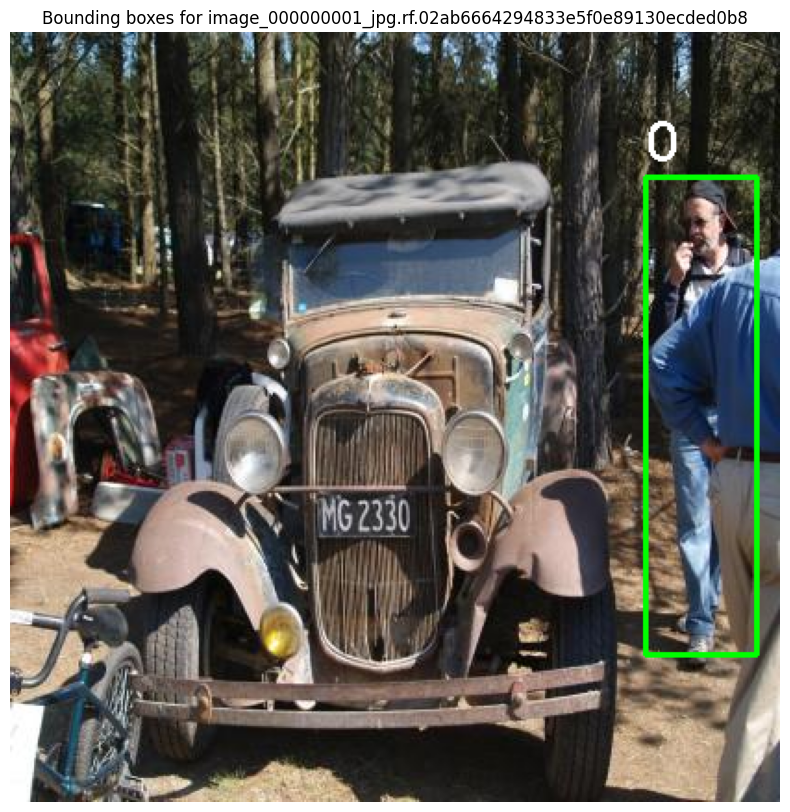

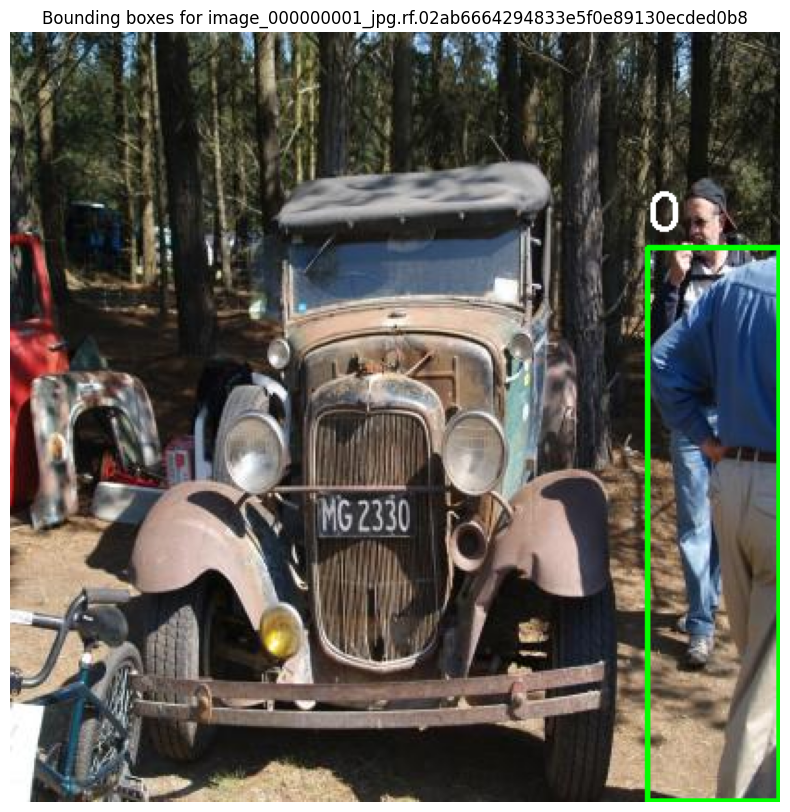

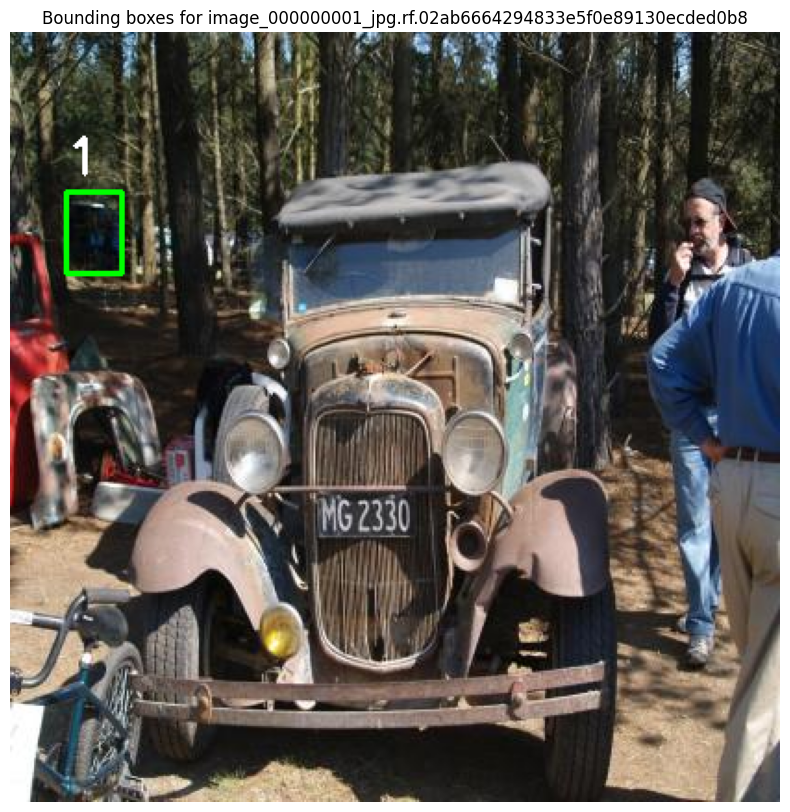

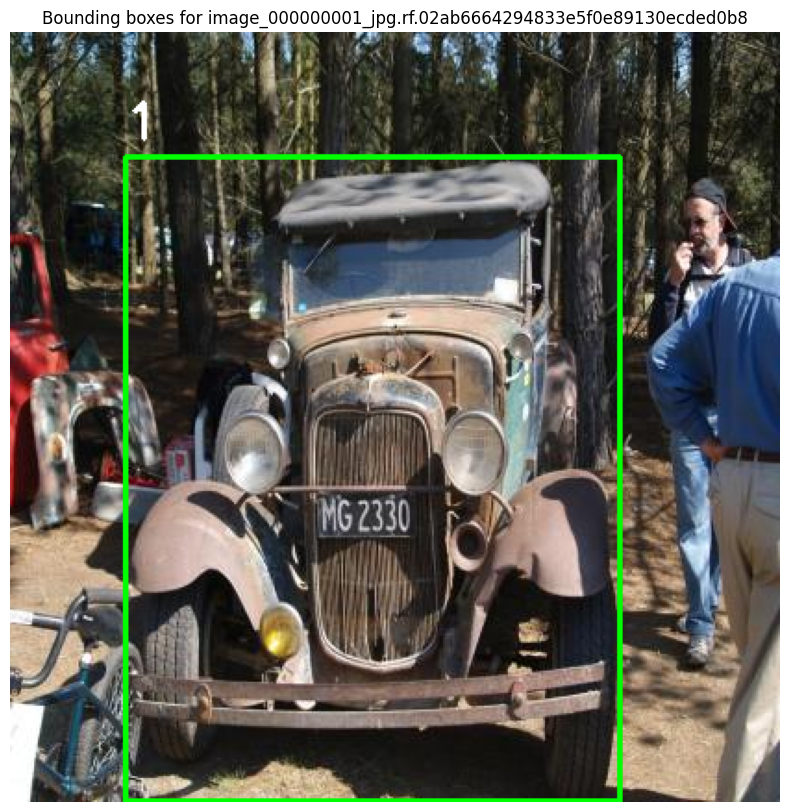

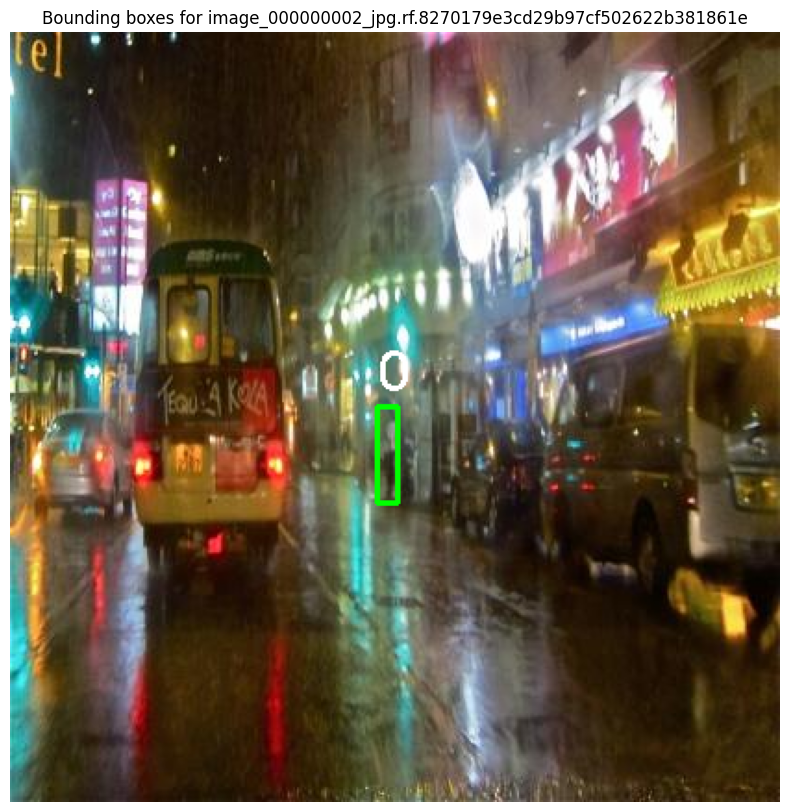

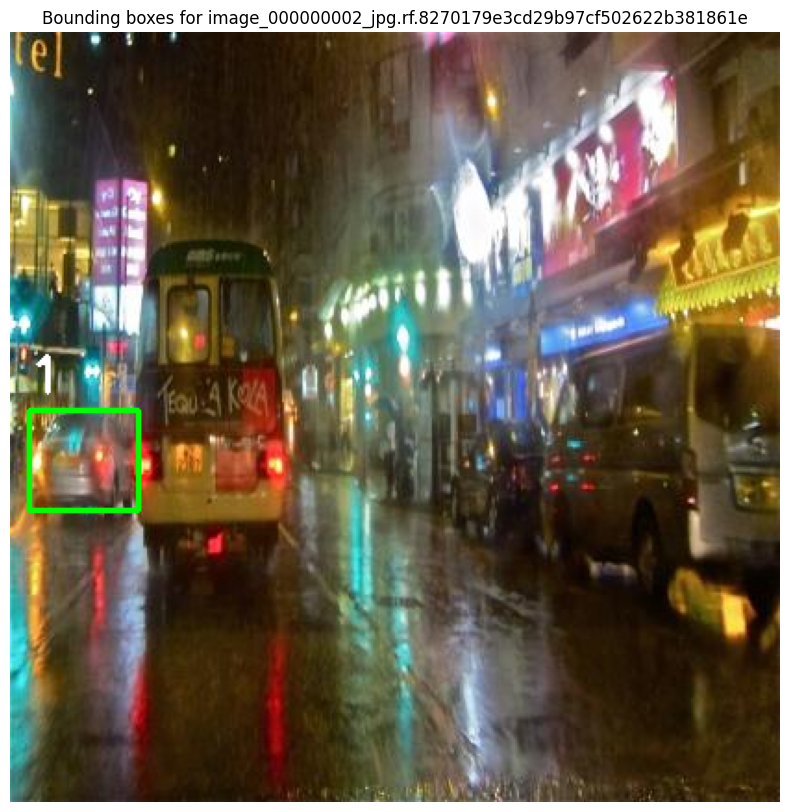

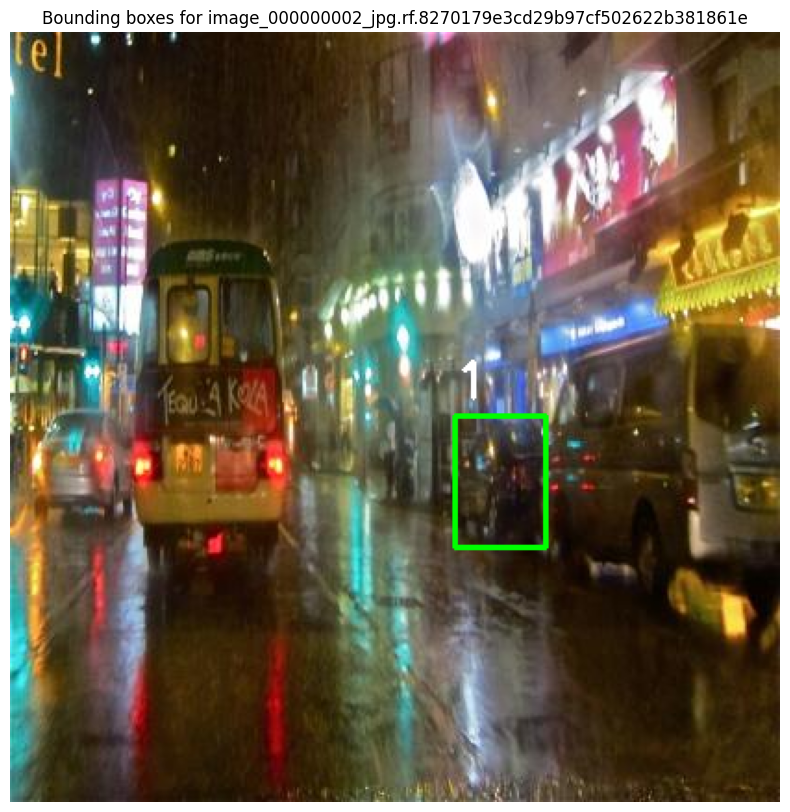

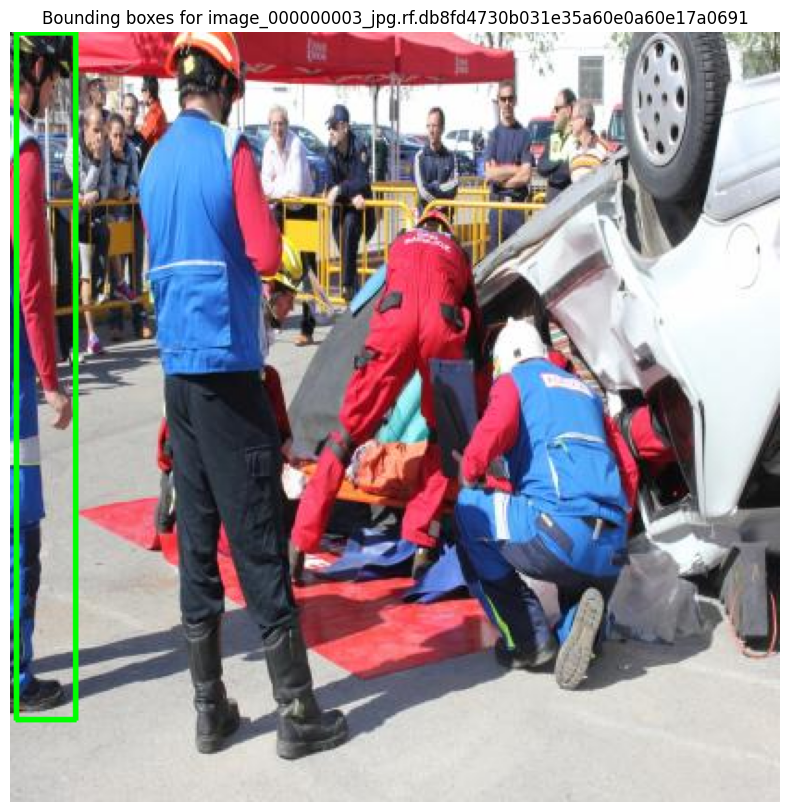

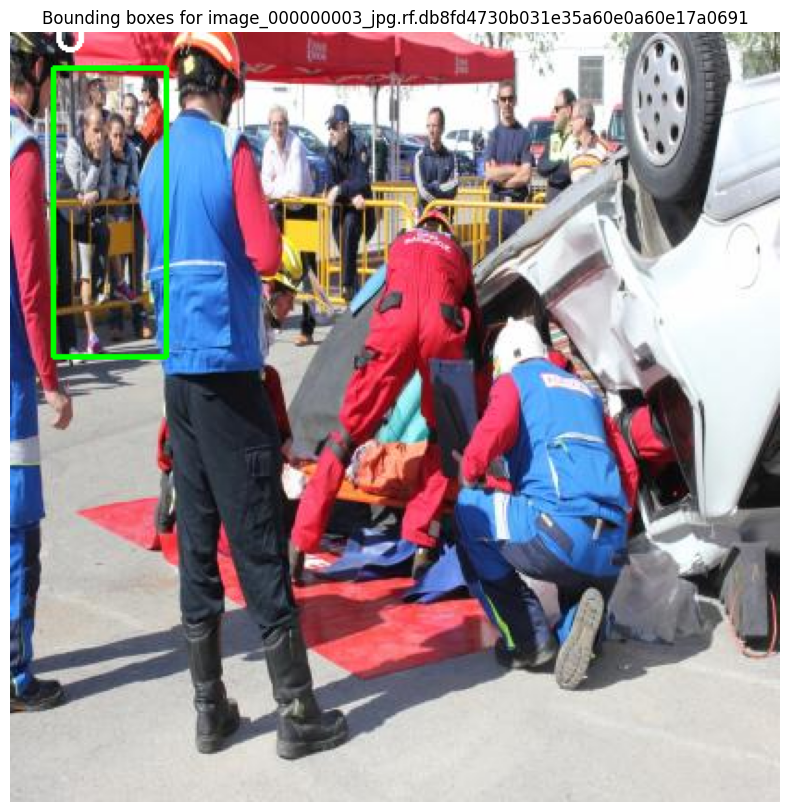

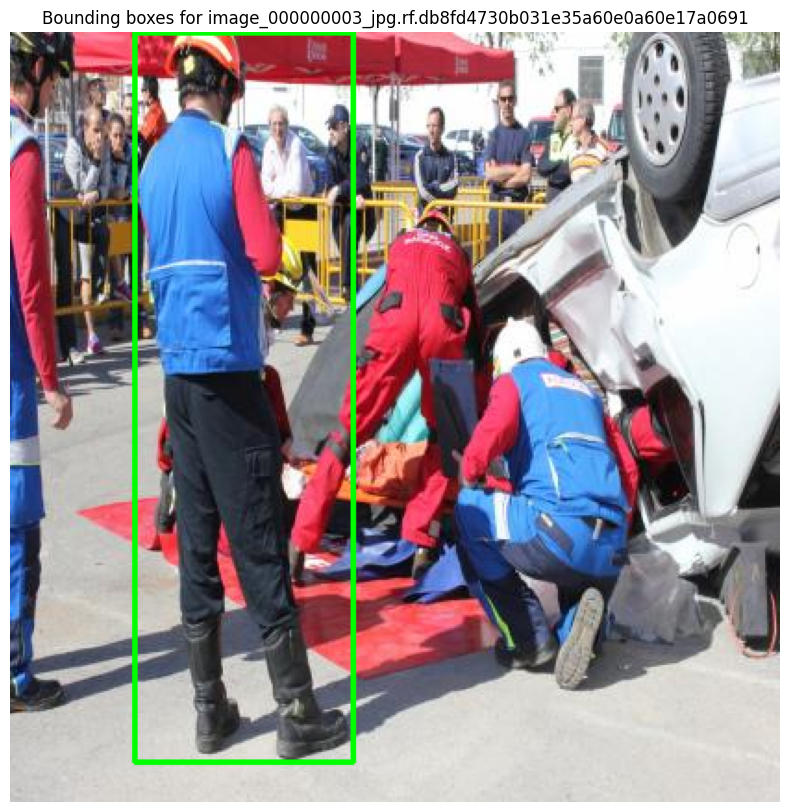

In [10]:
import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt

def get_image_path(image_dir, image_name):
    return os.path.join(image_dir, image_name + ".jpg")

def visualize_bounding_boxes(csv_file, image_dir):
    df = pd.read_csv(csv_file)
    i=0
    # Iterate over each row in the DataFrame
    for _, row in df.iterrows():
        i+=1
        image_name = row["image_name"]
        xmin, ymin, xmax, ymax = int(row["xmin"]), int(row["ymin"]), int(row["xmax"]), int(row["ymax"])
        
        # Load image
        image_path = get_image_path(image_dir, image_name)
        image = cv2.imread(image_path)
        
        if image is None:
            print(f"Image {image_path} not found.")
            continue
        
        # Draw bounding box
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        
        # Optionally add labels or other visualizations here
        # Example: Adding a label text (optional)
        label_text = str(row["class_label"])
        cv2.putText(image, label_text, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 255), 2)
        
        # Convert BGR to RGB for matplotlib
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Display using matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(image_rgb)
        plt.axis('off')
        plt.title(f"Bounding boxes for {image_name}")
        plt.show()
        if i==10:
            break

# Usage
csv_file_path = "bounding_boxes2_with_labels.csv"  # path to your CSV file
image_directory = "evaluation-dataset/my-data/images"  # path to your images directory

visualize_bounding_boxes(csv_file_path, image_directory)


In [2]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import pandas as pd 

from tqdm import tqdm
from tqdm import tqdm_notebook as tqdm # progress bar
from tqdm.notebook import tqdm
tqdm.pandas()

from datetime import datetime
import time
import matplotlib.pyplot as plt

import os, json, cv2, random
import skimage.io as io
import copy
from pathlib import Path
from typing import Optional
import json
import matplotlib.pyplot as plt

import ast


from tqdm import tqdm
import itertools

import torch
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

from glob import glob
import numba
from numba import jit

from pycocotools.coco import COCO
# detectron2
from detectron2.structures import BoxMode
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.engine import DefaultPredictor, DefaultTrainer, launch
from detectron2.evaluation import COCOEvaluator
from detectron2.structures import BoxMode
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.logger import setup_logger
from detectron2.utils.visualizer import Visualizer

from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader, build_detection_train_loader
from detectron2.data import detection_utils as utils


from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader, build_detection_train_loader
from detectron2.data import detection_utils as utils
import detectron2.data.transforms as T
from detectron2.evaluation import COCOEvaluator, inference_on_dataset



from detectron2.evaluation.evaluator import DatasetEvaluator
import pycocotools.mask as mask_util
from detectron2.engine import BestCheckpointer
from detectron2.checkpoint import DetectionCheckpointer

setup_logger()


<Logger detectron2 (DEBUG)>

In [3]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

2.2.1+cpu False


In [4]:
df_train = pd.read_csv('bounding_boxes2.csv')

In [5]:
x_min = df_train['xmin']
y_min = df_train['ymin']
x_max = df_train['xmax']
y_max = df_train['ymax']
bboxes = list()
for i in range(len(x_min)):
    bboxes.append([[x_min[i],y_min[i],x_max[i],y_max[i]]])
df_train['bboxes'] = bboxes

In [6]:
df_train["Width"]=416
df_train["Height"]=416
df_train.sample(2)

,image_name,xmin,ymin,xmax,ymax,bboxes,Width,Height
420,image_000000248_jpg.rf.2dc7a1e2e49e875ae2e3b69...,162,181,357,309,"[[162, 181, 357, 309]]",416,416
523,image_000000311_jpg.rf.131059664a0456db2f118d3...,372,0,415,34,"[[372, 0, 415, 34]]",416,416


In [8]:
train_path = 'evaluation-dataset/my-data/images/'
path = list()
for i in df_train['image_name']:
    path.append(train_path + i +'.jpg')

In [9]:
df_train['image_path'] = path
df_train.sample(2)

,image_name,xmin,ymin,xmax,ymax,bboxes,Width,Height,image_path
244,image_000000107_jpg.rf.1b43ee6149ad2c76fb98618...,18,153,39,211,"[[18, 153, 39, 211]]",416,416,evaluation-dataset/my-data/images/image_000000...
382,image_000000203_jpg.rf.7ad60ba3e92879621c37ad9...,260,109,319,268,"[[260, 109, 319, 268]]",416,416,evaluation-dataset/my-data/images/image_000000...


In [10]:
id = list()
for i in df_train['image_name']:
    id.append(i[:-4])

In [11]:
df_train['image_id'] = id
df_train.sample(2)

,image_name,xmin,ymin,xmax,ymax,bboxes,Width,Height,image_path,image_id
553,image_000000329_jpg.rf.5820fc02c92b79a77267a79...,327,89,361,342,"[[327, 89, 361, 342]]",416,416,evaluation-dataset/my-data/images/image_000000...,image_000000329_jpg.rf.5820fc02c92b79a77267a79...
90,image_000000022_jpg.rf.7d5b8cf7ee87ad3a595adf8...,216,151,222,164,"[[216, 151, 222, 164]]",416,416,evaluation-dataset/my-data/images/image_000000...,image_000000022_jpg.rf.7d5b8cf7ee87ad3a595adf8...


In [12]:
n_spl=3
Selected_Fold=2 #0..2

from sklearn.model_selection import GroupKFold
gkf  = GroupKFold(n_splits = n_spl) # num_folds=3 as there are total 3 videos
df_train = df_train.reset_index(drop=True)
df_train['fold'] = -1
for fold, (train_idx, val_idx) in enumerate(gkf.split(df_train, groups = df_train.image_id.tolist())):
    df_train.loc[val_idx, 'fold'] = fold
display(df_train.fold.value_counts())

fold
1    256
2    256
0    255
Name: count, dtype: int64

In [13]:
def get_data_dicts(
    _train_df: pd.DataFrame,
    debug: bool = False,
    data_type:str="train"
   
):

    if debug:
        _train_df = _train_df.iloc[:10]  # For debug...
    dataset_dicts = []
    if data_type=="train":
        _train_df=_train_df[_train_df.fold != Selected_Fold]
    else: # val
        _train_df=_train_df[_train_df.fold == Selected_Fold] 
        
    for index, row in tqdm(_train_df.iterrows(), total=len(_train_df)):
        record = {}
        filename  = row.image_path #filename = str(f'{imgdir}/{image_id}.png')
        image_id = row.image_id
        image_height= row.Height
        image_width = row.Width
        bboxes_coco = row.bboxes
        #bboxes_coco  = np.array(row.bboxes).astype(np.float32).copy()
        record["file_name"] = filename
        record["image_id"] = image_id
        record["width"] = image_width
        record["height"] = image_height
        objs = []
        class_id = 0
        for bbox_idx in range(len(bboxes_coco)):
            bbox=bboxes_coco[bbox_idx]
            obj = {
                    "bbox": bbox,
                    "bbox_mode": BoxMode.XYXY_ABS,
                    "category_id": class_id,
                }
            objs.append(obj)
            record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [14]:
thing_classes=['car']
debug=False

Data_Resister_training="BR_data_train2";
Data_Resister_valid="BR_data_valid2";


DatasetCatalog.register(
    Data_Resister_training,
    lambda: get_data_dicts(
        df_train,
        debug=debug,
        data_type="train"
    ),
)
MetadataCatalog.get(Data_Resister_training).set(thing_classes=thing_classes)
    

DatasetCatalog.register(
    Data_Resister_valid,
    lambda: get_data_dicts(
        df_train,
        debug=debug,
        data_type="val"
        ),
    )
MetadataCatalog.get(Data_Resister_valid).set(thing_classes=thing_classes)
    

dataset_dicts_train = DatasetCatalog.get(Data_Resister_training)
metadata_dicts_train = MetadataCatalog.get(Data_Resister_training)

dataset_dicts_valid = DatasetCatalog.get(Data_Resister_valid)
metadata_dicts_valid = MetadataCatalog.get(Data_Resister_valid)

100%|██████████| 256/256 [00:00<00:00, 18353.93it/s]


In [16]:
dataset_dicts_valid

[{'file_name': 'evaluation-dataset/my-data/images/image_000000002_jpg.rf.8270179e3cd29b97cf502622b381861e.jpg',
  'image_id': 'image_000000002_jpg.rf.8270179e3cd29b97cf502622b381',
  'width': 416,
  'height': 416,
  'annotations': [{'bbox': [198, 202, 209, 254],
    'bbox_mode': <BoxMode.XYXY_ABS: 0>,
    'category_id': 0}]},
 {'file_name': 'evaluation-dataset/my-data/images/image_000000002_jpg.rf.8270179e3cd29b97cf502622b381861e.jpg',
  'image_id': 'image_000000002_jpg.rf.8270179e3cd29b97cf502622b381',
  'width': 416,
  'height': 416,
  'annotations': [{'bbox': [10, 204, 69, 258],
    'bbox_mode': <BoxMode.XYXY_ABS: 0>,
    'category_id': 0}]},
 {'file_name': 'evaluation-dataset/my-data/images/image_000000002_jpg.rf.8270179e3cd29b97cf502622b381861e.jpg',
  'image_id': 'image_000000002_jpg.rf.8270179e3cd29b97cf502622b381',
  'width': 416,
  'height': 416,
  'annotations': [{'bbox': [240, 207, 289, 278],
    'bbox_mode': <BoxMode.XYXY_ABS: 0>,
    'category_id': 0}]},
 {'file_name': 'ev

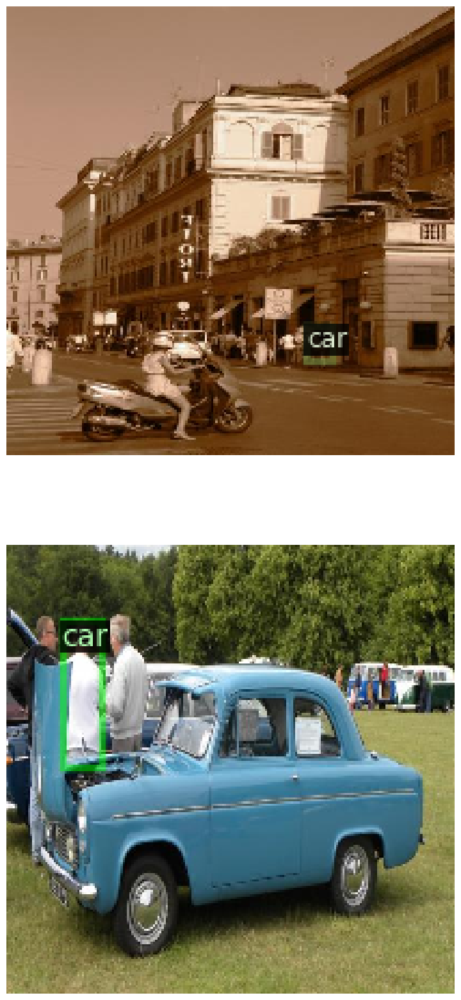

In [15]:
fig, ax = plt.subplots(2, 1, figsize =(35,20))
i=-1
for d in random.sample(dataset_dicts_train, 2):
    i=i+1    
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, :],
                   metadata=metadata_dicts_train, 
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_dataset_dict(d)
    ax[i].grid(False)
    ax[i].axis('off')
    ax[i].imshow(out.get_image()[:, :, ::-1])

In [19]:
import detectron2
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.visualizer import Visualizer
from detectron2.structures import BoxMode

# Sample dataset
# dataset_dicts = [
#     {
#         'file_name': 'evaluation-dataset/my-data/images/image_000000002_jpg.rf.8270179e3cd29b97cf502622b381861e.jpg',
#         'image_id': 'image_000000002_jpg.rf.8270179e3cd29b97cf502622b381',
#         'width': 416,
#         'height': 416,
#         'annotations': [
#             {'bbox': [198, 202, 209, 254], 'bbox_mode': BoxMode.XYXY_ABS, 'category_id': 0},
#             {'bbox': [10, 204, 69, 258], 'bbox_mode': BoxMode.XYXY_ABS, 'category_id': 0}
#         ]
#     }
# ]
dataset_dicts=dataset_dicts_valid+dataset_dicts_train
# Register the dataset
def get_dicts():
    return dataset_dicts

dataset_name = 'my_dataset_combined'
DatasetCatalog.register(dataset_name, get_dicts)
MetadataCatalog.get(dataset_name).set(thing_classes=["class_name"])

# Verify that the dataset is correctly registered
dataset_dicts = DatasetCatalog.get(dataset_name)
print(len(dataset_dicts))

[{'file_name': 'evaluation-dataset/my-data/images/image_000000002_jpg.rf.8270179e3cd29b97cf502622b381861e.jpg', 'image_id': 'image_000000002_jpg.rf.8270179e3cd29b97cf502622b381', 'width': 416, 'height': 416, 'annotations': [{'bbox': [198, 202, 209, 254], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'category_id': 0}]}, {'file_name': 'evaluation-dataset/my-data/images/image_000000002_jpg.rf.8270179e3cd29b97cf502622b381861e.jpg', 'image_id': 'image_000000002_jpg.rf.8270179e3cd29b97cf502622b381', 'width': 416, 'height': 416, 'annotations': [{'bbox': [10, 204, 69, 258], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'category_id': 0}]}, {'file_name': 'evaluation-dataset/my-data/images/image_000000002_jpg.rf.8270179e3cd29b97cf502622b381861e.jpg', 'image_id': 'image_000000002_jpg.rf.8270179e3cd29b97cf502622b381', 'width': 416, 'height': 416, 'annotations': [{'bbox': [240, 207, 289, 278], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'category_id': 0}]}, {'file_name': 'evaluation-dataset/my-data/images/image_000000013_jpg

In [20]:
print(len(dataset_dicts))

767


In [31]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor

# Initialize the configuration
cfg = get_cfg()

# Use the absolute path to the configuration file
config_path = r"c:\Users\landa\AppData\Local\Programs\Python\Python39\lib\site-packages\detectron2\model_zoo\configs\COCO-Detection\faster_rcnn_R_50_FPN_3x.yaml"
cfg.merge_from_file(config_path)

# Set model weights and other configurations
cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Set threshold for this model
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # Number of classes in your dataset

# Set the device to CPU
cfg.MODEL.DEVICE = "cpu"

# Initialize the predictor
predictor = DefaultPredictor(cfg)


[07/29 11:30:40 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl ...


INFO:iopath.common.file_io:Downloading https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl ...
INFO:iopath.common.download:Downloading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl ...
model_final_280758.pkl: 167MB [00:17, 9.52MB/s]                               
INFO:iopath.common.download:Successfully downloaded C:\Users\landa/.torch/iopath_cache\detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458\model_final_280758.pkl. 167266879 bytes.
INFO:iopath.common.file_io:URL https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl cached in C:\Users\landa/.torch/iopath_cache\detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458\model_final_280758.pkl
INFO:fvcore.common.checkpoint:[Checkpointer] Loading from C:\Users\landa/.torch/iopath_cache\detectron2/COCO-Detection/faster_rcnn_R_50_FPN_

[07/29 11:32:46 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl ...


INFO:fvcore.common.checkpoint:[Checkpointer] Loading from C:\Users\landa/.torch/iopath_cache\detectron2/COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458\model_final_280758.pkl ...
INFO:fvcore.common.checkpoint:Reading a file from 'Detectron2 Model Zoo'
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


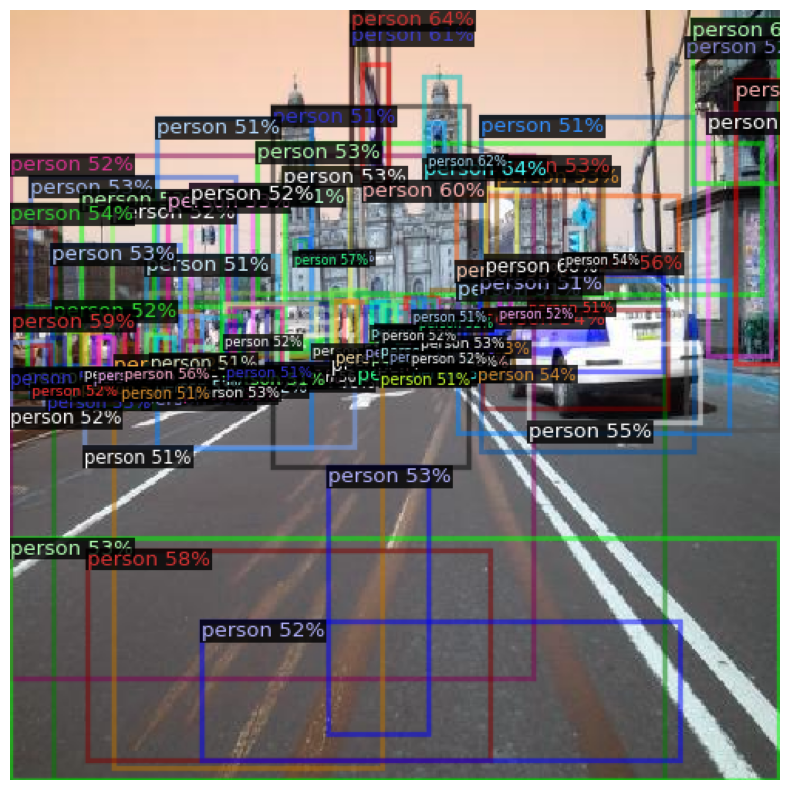

In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# Initialize the configuration
cfg = get_cfg()
config_path = r"c:\Users\landa\AppData\Local\Programs\Python\Python39\lib\site-packages\detectron2\model_zoo\configs\COCO-Detection\faster_rcnn_R_50_FPN_3x.yaml"
cfg.merge_from_file(config_path)
cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Set threshold for this model
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # Number of classes in your dataset
cfg.MODEL.DEVICE = "cpu"  # Use CPU

# Initialize the predictor
predictor = DefaultPredictor(cfg)

# Load the image
image_path = "evaluation-dataset/my-data/images/image_000000013_jpg.rf.596954d88b03ca3af5793b6fdcaa49eb.jpg"
image = cv2.imread(image_path)

# Make predictions
outputs = predictor(image)

# Visualize the predictions
v = Visualizer(image[:, :, ::-1], metadata=MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
output_image = v.draw_instance_predictions(outputs["instances"].to("cpu"))

# Convert BGR to RGB for display
output_image = output_image.get_image()[:, :, ::-1]

# Display using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(output_image)
plt.axis('off')
plt.show()


c:\Users\landa\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3550.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


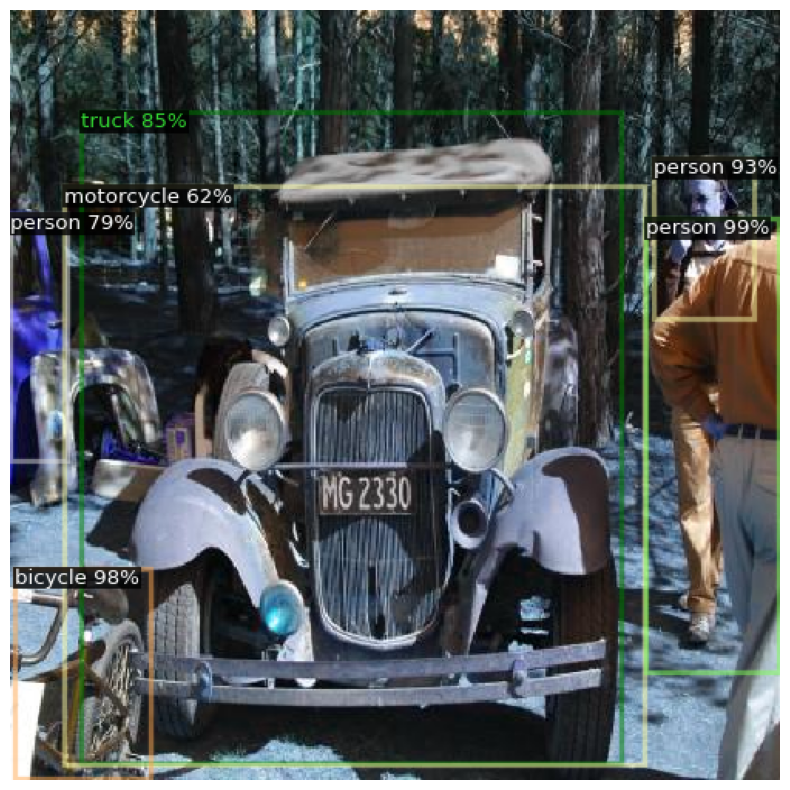

In [11]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
import cv2
import matplotlib.pyplot as plt

# Initialize the configuration
cfg = get_cfg()
config_path = r"c:\Users\landa\AppData\Local\Programs\Python\Python39\lib\site-packages\detectron2\model_zoo\configs\COCO-Detection\faster_rcnn_R_50_FPN_3x.yaml"
cfg.merge_from_file(config_path)
cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6  # Set threshold for this model
cfg.MODEL.DEVICE = "cpu"  # Use CPU

# Initialize the predictor
predictor = DefaultPredictor(cfg)

# Load the image
image_path = "evaluation-dataset\my-data\images\image_000000001_jpg.rf.02ab6664294833e5f0e89130ecded0b8.jpg"
image = cv2.imread(image_path)

# Make predictions
outputs = predictor(image)

# Visualize the predictions
v = Visualizer(image[:, :, ::-1], metadata=MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
output_image = v.draw_instance_predictions(outputs["instances"].to("cpu"))

# Convert BGR to RGB for display
output_image = output_image.get_image()[:, :, ::-1]

# Display using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(output_image)
plt.axis('off')
plt.show()


In [12]:
import os
import cv2
import pandas as pd
import numpy as np
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.structures import BoxMode

def get_image_path(image_dir, image_name):
    return os.path.join(image_dir, image_name + ".jpg")

def compute_iou(box1, box2):
    x1, y1, x2, y2 = box1
    x3, y3, x4, y4 = box2
    
    xA = max(x1, x3)
    yA = max(y1, y3)
    xB = min(x2, x4)
    yB = min(y2, y4)
    
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    box1Area = (x2 - x1 + 1) * (y2 - y1 + 1)
    box2Area = (x4 - x3 + 1) * (y4 - y3 + 1)
    
    iou = interArea / float(box1Area + box2Area - interArea)
    return iou


In [13]:
def load_ground_truth(csv_file):
    df = pd.read_csv(csv_file)
    ground_truth = {}
    for _, row in df.iterrows():
        image_name = row["image_name"]
        xmin, ymin, xmax, ymax = int(row["xmin"]), int(row["ymin"]), int(row["xmax"]), int(row["ymax"])
        class_label = row["class_label"]
        
        if image_name not in ground_truth:
            ground_truth[image_name] = []
        
        ground_truth[image_name].append((xmin, ymin, xmax, ymax, class_label))
    
    return ground_truth

def get_predictions(predictor, image_path):
    im = cv2.imread(image_path)
    outputs = predictor(im)
    return outputs["instances"].to("cpu")


In [15]:
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg

def setup_predictor():
    cfg = get_cfg()
    config_path = r"c:\Users\landa\AppData\Local\Programs\Python\Python39\lib\site-packages\detectron2\model_zoo\configs\COCO-Detection\faster_rcnn_R_50_FPN_3x.yaml"
    cfg.merge_from_file(config_path)
    cfg.MODEL.WEIGHTS ="detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
    cfg.MODEL.DEVICE = 'cpu'  # Ensure this line is set to 'cpu'
    return DefaultPredictor(cfg)

predictor = setup_predictor()


In [16]:
def get_predictions(predictor, image_path):
    im = cv2.imread(image_path)
    outputs = predictor(im)
    return outputs["instances"].to("cpu")  # Ensure this is set to CPU

def compute_accuracy(ground_truth, predictor, image_dir):
    total_true_positive = 0
    total_ground_truth = 0
    
    for image_name, gt_boxes in ground_truth.items():
        image_path = get_image_path(image_dir, image_name)
        predictions = get_predictions(predictor, image_path)
        
        pred_boxes = predictions.pred_boxes.tensor.numpy()
        pred_classes = predictions.pred_classes.numpy()
        
        # Check if any predictions match ground truth
        for gt_box in gt_boxes:
            gt_xmin, gt_ymin, gt_xmax, gt_ymax, gt_class = gt_box
            best_iou = 0
            best_match = None
            for i, (pred_box, pred_class) in enumerate(zip(pred_boxes, pred_classes)):
                iou = compute_iou((gt_xmin, gt_ymin, gt_xmax, gt_ymax), tuple(pred_box))
                if iou > best_iou:
                    best_iou = iou
                    best_match = pred_class
            
            if best_iou > 0.5 and best_match == gt_class:
                total_true_positive += 1
            total_ground_truth += 1
    
    accuracy = total_true_positive / total_ground_truth if total_ground_truth > 0 else 0
    print(f"Accuracy: {accuracy:.2f}")

# Usage
csv_file_path = "bounding_boxes2_with_labels.csv"  # path to your CSV file
image_directory = "evaluation-dataset/my-data/images"  # path to your images directory

# Load ground truth and compute accuracy
ground_truth = load_ground_truth(csv_file_path)
compute_accuracy(ground_truth, predictor, image_directory)


Accuracy: 0.46


In [17]:
import os
import cv2
import pandas as pd
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
import time

def setup_predictor():
    cfg = get_cfg()
    cfg.merge_from_file("c:/Users/landa/AppData/Local/Programs/Python/Python39/lib/site-packages/detectron2/model_zoo/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
    cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
    cfg.MODEL.DEVICE = 'cpu'  # Ensure this line is set to 'cpu'
    return DefaultPredictor(cfg)

def get_predictions(predictor, image_path):
    im = cv2.imread(image_path)
    outputs = predictor(im)
    return outputs["instances"].to("cpu")  # Ensure this is set to CPU

def load_ground_truth(csv_file):
    df = pd.read_csv(csv_file)
    ground_truth = {}
    for _, row in df.iterrows():
        image_name = row["image_name"]
        xmin, ymin, xmax, ymax = int(row["xmin"]), int(row["ymin"]), int(row["xmax"]), int(row["ymax"])
        if image_name not in ground_truth:
            ground_truth[image_name] = []
        ground_truth[image_name].append((xmin, ymin, xmax, ymax))
    return ground_truth

def check_overlap(box1, box2):
    x1, y1, x2, y2 = box1
    x1_p, y1_p, x2_p, y2_p = box2

    # Check if there is any overlap
    if x1 < x2_p and x2 > x1_p and y1 < y2_p and y2 > y1_p:
        return True
    return False

def compute_accuracy(ground_truth, predictor, image_dir):
    start_time = time.time()  # Start timing
    
    total_true_positive = 0
    total_ground_truth = 0
    
    for image_name, gt_boxes in ground_truth.items():
        image_path = os.path.join(image_dir, image_name + ".jpg")
        predictions = get_predictions(predictor, image_path)
        
        pred_boxes = predictions.pred_boxes.tensor.numpy()
        
        # Check if any predictions overlap with ground truth
        for gt_box in gt_boxes:
            gt_xmin, gt_ymin, gt_xmax, gt_ymax = gt_box
            match_found = False
            for pred_box in pred_boxes:
                if check_overlap((gt_xmin, gt_ymin, gt_xmax, gt_ymax), tuple(pred_box)):
                    match_found = True
                    break
            if match_found:
                total_true_positive += 1
            total_ground_truth += 1
    
    accuracy = total_true_positive / total_ground_truth if total_ground_truth > 0 else 0
    
    end_time = time.time()  # End timing
    elapsed_time = end_time - start_time
    
    print(f"Accuracy: {accuracy:.2f}")
    print(f"Time taken: {elapsed_time:.2f} seconds")

# Usage
csv_file_path = "bounding_boxes2_with_labels.csv"  # path to your CSV file
image_directory = "evaluation-dataset/my-data/images"  # path to your images directory

predictor = setup_predictor()

# Load ground truth and compute accuracy
ground_truth = load_ground_truth(csv_file_path)
compute_accuracy(ground_truth, predictor, image_directory)


Accuracy: 0.96
Time taken: 211.67 seconds


In [18]:
import os
import cv2
import pandas as pd
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
import time

def setup_predictor():
    cfg = get_cfg()
    cfg.merge_from_file("c:/Users/landa/AppData/Local/Programs/Python/Python39/lib/site-packages/detectron2/model_zoo/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
    cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
    cfg.MODEL.DEVICE = 'cpu'  # Ensure this line is set to 'cpu'
    return DefaultPredictor(cfg)

def get_predictions(predictor, image_path):
    im = cv2.imread(image_path)
    outputs = predictor(im)
    return outputs["instances"].to("cpu")  # Ensure this is set to CPU

def load_ground_truth(csv_file):
    df = pd.read_csv(csv_file)
    ground_truth = {}
    for _, row in df.iterrows():
        image_name = row["image_name"]
        xmin, ymin, xmax, ymax = int(row["xmin"]), int(row["ymin"]), int(row["xmax"]), int(row["ymax"])
        if image_name not in ground_truth:
            ground_truth[image_name] = []
        ground_truth[image_name].append((xmin, ymin, xmax, ymax))
    return ground_truth

def check_overlap(box1, box2):
    x1, y1, x2, y2 = box1
    x1_p, y1_p, x2_p, y2_p = box2

    # Check if there is any overlap
    if x1 < x2_p and x2 > x1_p and y1 < y2_p and y2 > y1_p:
        return True
    return False

def compute_accuracy(ground_truth, predictor, image_dir):
    start_time = time.time()  # Start timing
    
    total_true_positive = 0
    total_false_positive = 0
    total_ground_truth = 0
    
    for image_name, gt_boxes in ground_truth.items():
        image_path = os.path.join(image_dir, image_name + ".jpg")
        predictions = get_predictions(predictor, image_path)
        
        pred_boxes = predictions.pred_boxes.tensor.numpy()
        
        matched_gt_boxes = set()
        matched_pred_boxes = set()
        
        # Check for true positives
        for gt_idx, gt_box in enumerate(gt_boxes):
            gt_xmin, gt_ymin, gt_xmax, gt_ymax = gt_box
            match_found = False
            for pred_idx, pred_box in enumerate(pred_boxes):
                if check_overlap((gt_xmin, gt_ymin, gt_xmax, gt_ymax), tuple(pred_box)):
                    match_found = True
                    matched_pred_boxes.add(pred_idx)
                    break
            if match_found:
                matched_gt_boxes.add(gt_idx)
                total_true_positive += 1
            total_ground_truth += 1
        
        # Check for false positives
        total_false_positive += len(pred_boxes) - len(matched_pred_boxes)
    
    accuracy = total_true_positive / (total_ground_truth + total_false_positive) if total_ground_truth + total_false_positive > 0 else 0
    
    end_time = time.time()  # End timing
    elapsed_time = end_time - start_time
    
    print(f"Accuracy: {accuracy:.2f}")
    print(f"Time taken: {elapsed_time:.2f} seconds")

# Usage
csv_file_path = "bounding_boxes2_with_labels.csv"  # path to your CSV file
image_directory = "evaluation-dataset/my-data/images"  # path to your images directory

predictor = setup_predictor()

# Load ground truth and compute accuracy
ground_truth = load_ground_truth(csv_file_path)
compute_accuracy(ground_truth, predictor, image_directory)


Accuracy: 0.56
Time taken: 200.38 seconds


In [14]:
def compute_accuracy(ground_truth, predictor, image_dir):
    total_true_positive = 0
    total_ground_truth = 0
    
    for image_name, gt_boxes in ground_truth.items():
        image_path = get_image_path(image_dir, image_name)
        predictions = get_predictions(predictor, image_path)
        
        pred_boxes = predictions.pred_boxes.tensor.numpy()
        pred_classes = predictions.pred_classes.numpy()
        
        # Check if any predictions match ground truth
        for gt_box in gt_boxes:
            gt_xmin, gt_ymin, gt_xmax, gt_ymax, gt_class = gt_box
            best_iou = 0
            best_match = None
            for i, (pred_box, pred_class) in enumerate(zip(pred_boxes, pred_classes)):
                iou = compute_iou((gt_xmin, gt_ymin, gt_xmax, gt_ymax), tuple(pred_box))
                if iou > best_iou:
                    best_iou = iou
                    best_match = pred_class
            
            if best_iou > 0.5 and best_match == gt_class:
                total_true_positive += 1
            total_ground_truth += 1
    
    accuracy = total_true_positive / total_ground_truth if total_ground_truth > 0 else 0
    print(f"Accuracy: {accuracy:.2f}")

# Initialize Detectron2 model
config_path = r"c:\Users\landa\AppData\Local\Programs\Python\Python39\lib\site-packages\detectron2\model_zoo\configs\COCO-Detection\faster_rcnn_R_50_FPN_3x.yaml"
cfg = get_cfg()
cfg.merge_from_file(config_path)
cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)

# Paths
csv_file_path = "bounding_boxes2_with_labels.csv"  # path to your CSV file
image_directory = "evaluation-dataset/my-data/images"  # path to your images directory

# Load ground truth and compute accuracy
ground_truth = load_ground_truth(csv_file_path)
compute_accuracy(ground_truth, predictor, image_directory)


AssertionError: Torch not compiled with CUDA enabled

In [30]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor

# Initialize the configuration
cfg = get_cfg()

# Use the absolute path to the configuration file
config_path = r"c:\Users\landa\AppData\Local\Programs\Python\Python39\lib\site-packages\detectron2\model_zoo\configs\COCO-Detection\faster_rcnn_R_50_FPN_3x.yaml"
cfg.merge_from_file(config_path)

# Set model weights and other configurations
cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Set threshold for this model
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # Number of classes in your dataset

# Initialize the predictor
predictor = DefaultPredictor(cfg)


AssertionError: Torch not compiled with CUDA enabled

In [29]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor

# Initialize the configuration
cfg = get_cfg()

# Use the correct relative path to the configuration file
config_path = "c:\Users\landa\AppData\Local\Programs\Python\Python39\lib\site-packages\detectron2\model_zoo/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"
cfg.merge_from_file(config_path)

# Set model weights and other configurations
cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Set threshold for this model
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # Number of classes in your dataset

# Initialize the predictor
predictor = DefaultPredictor(cfg)


SyntaxError: (unicode error) 'unicodeescape' codec can't decode bytes in position 2-3: truncated \UXXXXXXXX escape (1114549774.py, line 8)

In [23]:
import detectron2
from detectron2.config import get_cfg

cfg = get_cfg()
print(cfg.config_file) 

AttributeError: config_file

In [24]:
import os
import detectron2

# Print the directory where Detectron2 is installed
detectron2_dir = os.path.dirname(detectron2.__file__)
print("Detectron2 Directory:", detectron2_dir)

# Print the path to the configs folder
configs_dir = os.path.join(detectron2_dir, "configs")
print("Configs Directory:", configs_dir)

# List files in the configs directory
if os.path.isdir(configs_dir):
    print("Files in Configs Directory:", os.listdir(configs_dir))
else:
    print("Configs Directory does not exist")

Detectron2 Directory: c:\Users\landa\AppData\Local\Programs\Python\Python39\lib\site-packages\detectron2
Configs Directory: c:\Users\landa\AppData\Local\Programs\Python\Python39\lib\site-packages\detectron2\configs
Configs Directory does not exist


In [25]:
import urllib.request

# URL of the configuration file
config_url = "https://raw.githubusercontent.com/facebookresearch/detectron2/main/tools/train_net.py"
config_path = "faster_rcnn_R_50_FPN_3x.yaml"

# Download the file
urllib.request.urlretrieve(config_url, config_path)
print(f"Configuration file downloaded to: {config_path}")

Configuration file downloaded to: faster_rcnn_R_50_FPN_3x.yaml


In [27]:
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file("faster_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Set threshold for this model
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # Number of classes in your dataset

ParserError: expected '<document start>', but found '<scalar>'
  in "faster_rcnn_R_50_FPN_3x.yaml", line 3, column 3

In [26]:
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor

cfg = get_cfg()
# Use the correct path to the configuration file
cfg.merge_from_file("faster_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Set threshold for this model
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # Number of classes in your dataset

predictor = DefaultPredictor(cfg)

ParserError: expected '<document start>', but found '<scalar>'
  in "faster_rcnn_R_50_FPN_3x.yaml", line 3, column 3

In [22]:
cfg = get_cfg()
cfg.merge_from_file("detectron2/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Set threshold for this model
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # Number of classes in your dataset

# Additional configuration if needed
cfg.DATASETS.TEST = ("my_dataset_combined",)
cfg.OUTPUT_DIR = "./output"  # Directory where output files will be saved


AssertionError: Config file 'detectron2/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml' does not exist!